In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle  #To generate the model
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from dataprep.eda import plot,plot_correlation,plot_missing
from pandas_profiling import ProfileReport
from sklearn.metrics import silhouette_samples,silhouette_score

NumExpr defaulting to 8 threads.


## Load Data

In [4]:
dfa = pd.read_csv("outputTunisianet.csv")
dfa = dfa[['brand','price','reference','title']]
print('Total Row : ', len(dfa))

Total Row :  1645


In [5]:
dfa.columns

Index(['brand', 'price', 'reference', 'title'], dtype='object')

In [6]:
dfa

,brand,price,reference,title
0,https://www.tunisianet.com.tn/270_versus,"439,000 DT",[VBOOK14SLVV1.],Pc portable Versus V-Book / Quad Core / 2 Go
1,https://www.tunisianet.com.tn/3_lenovo,"839,000 DT",[81D600DDFE],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
2,https://www.tunisianet.com.tn/3_lenovo,"889,000 DT",[82C6006GFE],PC Portable Lenovo V14 ADA / Dual Core / 4 Go
3,https://www.tunisianet.com.tn/79_asus,"899,000 DT",[X543NA-AR297T],Pc portable Asus X543NA / Dual Core / 4 Go / Gris
4,https://www.tunisianet.com.tn/3_lenovo,"902,000 DT",[81D600DDFE-8],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
...,...,...,...,...
1640,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS216],Montre Pour Femme Swatch LOVELY LILAC YLS216
1641,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS217],Montre Pour Femme Swatch STARRY PARTY YLS217
1642,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS220],Montre pour femme Swatch Rose Sparkle YLS220
1643,https://www.tunisianet.com.tn/874_swatch,"360,000 DT",[SFK389GA],Montre Pour femme Swatch INCANTATA SFK389GA / ...


In [8]:
pd.set_option('display.max_rows',dfa.shape[0]+1)

In [9]:
pd.set_option('display.max_rows',10)

In [10]:
dfa

,brand,price,reference,title
0,https://www.tunisianet.com.tn/270_versus,"439,000 DT",[VBOOK14SLVV1.],Pc portable Versus V-Book / Quad Core / 2 Go
1,https://www.tunisianet.com.tn/3_lenovo,"839,000 DT",[81D600DDFE],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
2,https://www.tunisianet.com.tn/3_lenovo,"889,000 DT",[82C6006GFE],PC Portable Lenovo V14 ADA / Dual Core / 4 Go
3,https://www.tunisianet.com.tn/79_asus,"899,000 DT",[X543NA-AR297T],Pc portable Asus X543NA / Dual Core / 4 Go / Gris
4,https://www.tunisianet.com.tn/3_lenovo,"902,000 DT",[81D600DDFE-8],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
...,...,...,...,...
1640,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS216],Montre Pour Femme Swatch LOVELY LILAC YLS216
1641,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS217],Montre Pour Femme Swatch STARRY PARTY YLS217
1642,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS220],Montre pour femme Swatch Rose Sparkle YLS220
1643,https://www.tunisianet.com.tn/874_swatch,"360,000 DT",[SFK389GA],Montre Pour femme Swatch INCANTATA SFK389GA / ...


# EDA : Exploratory data analysis with

#### - dataprep.eda
#### - pandas_profiling

  0%|          | 0/129 [00:00<?, ?it/s]

C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:881: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))



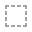
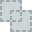
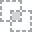
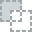
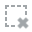
...
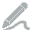
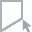
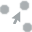
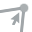
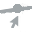

In [11]:
#Basic exploration for all comumns via plot(dfa)
plot(dfa)

  0%|          | 0/74 [00:00<?, ?it/s]

C:\Users\user\anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:881: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))



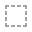
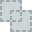
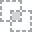
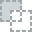
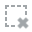
...
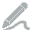
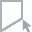
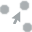
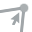
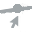

In [12]:
plot(dfa,'reference')

In [13]:
profile=ProfileReport(dfa)

In [14]:
profile = ProfileReport(dfa, title='Pandas Profiling Report', explorative=True)

In [15]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/17 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
profile.to_file("mediashop_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# As a string
json_data = profile.to_json()

# As a file
profile.to_file("json_report.json")

Render JSON:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
profile.to_widgets()

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

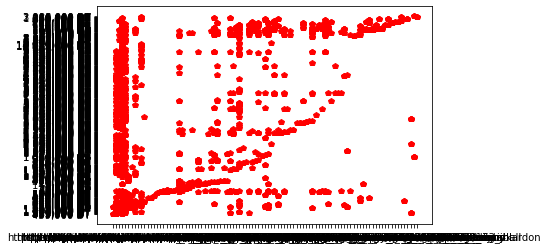

In [19]:
plt.plot(dfa.values[:,0],dfa.values[:,1],"rp");

# Treatment of missing values

In [20]:
#see missing values
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1645 entries, 0 to 1644
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   brand      1645 non-null   object
 1   price      1645 non-null   object
 2   reference  1645 non-null   object
 3   title      1645 non-null   object
dtypes: object(4)
memory usage: 51.5+ KB


In [21]:
#search missing values
dfa.isna()
dfa.isnull()
dfa.isna().sum(axis=0)  #claculale the number of missing values column by column
dfa.isna().sum(axis=1)  #claculale the number of missing values line by line
dfa.isnull().sum().sort_values(ascending=False)
dfa.isnull().sum().any()

False

In [22]:
(dfa.isna().sum()/dfa.shape[0])*100 #percentage of null values in our dataframe

brand        0.0
price        0.0
reference    0.0
title        0.0
dtype: float64

#####     If the percentage of missing fields > 95% ==>we delete the column
#####   If the percentage of missing fields<50%==>we delete the lines containing fields 
#####  If the percentage of missing fields betwen 50% et 95% ==>we are thinking of filling in these fields :mediane,moyen,frequent,previous or next value


In [23]:
###### solution 1:delete lines containing at least one missing field

dfa_clean=dfa.dropna() #thresh=5 :we fix to 5 missing values

In [24]:
dfa_clean.shape

(1645, 4)

In [25]:
#dfa_clean=dfa.dropna(axis=1) #delete comumns

In [26]:
#fill in the missing values:for the missing variables, we will replace them with the values that repeat the most
dfa.apply(lambda x:x.fillna(x.value_counts().index[0]))

,brand,price,reference,title
0,https://www.tunisianet.com.tn/270_versus,"439,000 DT",[VBOOK14SLVV1.],Pc portable Versus V-Book / Quad Core / 2 Go
1,https://www.tunisianet.com.tn/3_lenovo,"839,000 DT",[81D600DDFE],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
2,https://www.tunisianet.com.tn/3_lenovo,"889,000 DT",[82C6006GFE],PC Portable Lenovo V14 ADA / Dual Core / 4 Go
3,https://www.tunisianet.com.tn/79_asus,"899,000 DT",[X543NA-AR297T],Pc portable Asus X543NA / Dual Core / 4 Go / Gris
4,https://www.tunisianet.com.tn/3_lenovo,"902,000 DT",[81D600DDFE-8],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
...,...,...,...,...
1640,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS216],Montre Pour Femme Swatch LOVELY LILAC YLS216
1641,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS217],Montre Pour Femme Swatch STARRY PARTY YLS217
1642,https://www.tunisianet.com.tn/874_swatch,"345,000 DT",[YLS220],Montre pour femme Swatch Rose Sparkle YLS220
1643,https://www.tunisianet.com.tn/874_swatch,"360,000 DT",[SFK389GA],Montre Pour femme Swatch INCANTATA SFK389GA / ...


# Treatment of qualitative variables

In [27]:
dfa.dtypes

brand        object
price        object
reference    object
title        object
dtype: object

In [28]:
dfa.describe(include='O') #include = 'O': to display categorical values

,brand,price,reference,title
count,1645,1645,1645,1645
unique,97,588,1320,1274
top,https://www.tunisianet.com.tn/6_hp,"205,000 DT",[A3121H11],Enceinte et Radio-réveil Anker Soundcore Wakey...
freq,258,44,4,4


In [29]:
dfa_clean["brand"].nunique()  #97 categories

97

In [30]:
dfa['brand'].value_counts()

https://www.tunisianet.com.tn/6_hp                258
https://www.tunisianet.com.tn/874_swatch          180
https://www.tunisianet.com.tn/29_dell             119
https://www.tunisianet.com.tn/3_lenovo            110
https://www.tunisianet.com.tn/79_asus              82
                                                 ... 
https://www.tunisianet.com.tn/726_konig             1
https://www.tunisianet.com.tn/670_s-link-swapp      1
https://www.tunisianet.com.tn/230_gigabyte          1
https://www.tunisianet.com.tn/807_ramitech          1
https://www.tunisianet.com.tn/563_snopy             1
Name: brand, Length: 97, dtype: int64

In [31]:
#Remplace categorical values with numeric values 0,1,2,...
#labelencoder=LabelEncoder()
#for i in dfa_clean:
#    dfa_clean[i]=labelencoder.fit_transform(dfa_clean[i])

In [32]:
#dfa_clean

In [33]:
#labelencoder.inverse_transform([13])

### We should use One Hot Encoder if we have more than 2 categories

In [34]:
oneHotEncoder=OneHotEncoder()
matrice_brand=oneHotEncoder.fit_transform(dfa_clean['brand'].values.reshape(-1,1))
matrice_price=oneHotEncoder.fit_transform(dfa_clean['price'].values.reshape(-1,1))
matrice_reference=oneHotEncoder.fit_transform(dfa_clean['reference'].values.reshape(-1,1))
matrice_title=oneHotEncoder.fit_transform(dfa_clean['title'].values.reshape(-1,1))

In [35]:
brand_encode=matrice_brand.toarray()
price_encode=matrice_brand.toarray()
reference_encode=matrice_brand.toarray()
title_encode=matrice_brand.toarray()

In [36]:
print(type(brand_encode))
print(type(price_encode))
print(type(reference_encode))
print(type(title_encode))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [37]:
oneHotEncoder.categories_

[array(['2x Baguette Lumiere LED avec Aiment Xigmatek Xi-ray / Bleu',
        '2x Baguette Lumiere LED avec Aiment Xigmatek Xi-ray / Rouge',
        '2x Baguette Lumiere LED avec Aiment Xigmatek Xi-ray / Vert', ...,
        'Écran Samsung professionnel QB43R 43" / 4K UHD/ Wifi',
        'Écran Samsung professionnel QB49R 49" / 4K UHD/ Wifi',
        'Écran Samsung professionnel QB55R 55" / 4K UHD/ Wifi'],
       dtype=object)]

In [38]:
brand_df=pd.DataFrame(data=brand_encode,index=dfa_clean.index)
price_df=pd.DataFrame(data=price_encode,index=dfa_clean.index)
reference_df=pd.DataFrame(data=reference_encode,index=dfa_clean.index)
title_df=pd.DataFrame(data=title_encode,index=dfa_clean.index)

In [39]:
pd.set_option('display.max_rows',price_df.shape[0]+1)

##### **The trap of the dummy variable**

##### * When we encode a qualitative variable having more than 2 modalities, for example 6 modalities, we end up with a matrix with 6 columns.

##### * Often these 6 columns are auto-correlated

##### * We remove a column

##### Tunisia: one column with 24 governorates ==> One Hot Encoder ==> 24 colones ==> Dummy variables trap ==> remove of a column

# Concatinate Dataframes

In [40]:
#dfa_clean=dfa_clean.drop(columns=["column1","column1"])

In [41]:
dfa_clean

,brand,price,reference,title
0,https://www.tunisianet.com.tn/270_versus,"439,000 DT",[VBOOK14SLVV1.],Pc portable Versus V-Book / Quad Core / 2 Go
1,https://www.tunisianet.com.tn/3_lenovo,"839,000 DT",[81D600DDFE],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
2,https://www.tunisianet.com.tn/3_lenovo,"889,000 DT",[82C6006GFE],PC Portable Lenovo V14 ADA / Dual Core / 4 Go
3,https://www.tunisianet.com.tn/79_asus,"899,000 DT",[X543NA-AR297T],Pc portable Asus X543NA / Dual Core / 4 Go / Gris
4,https://www.tunisianet.com.tn/3_lenovo,"902,000 DT",[81D600DDFE-8],Pc Portable Lenovo IdeaPad 330-15AST / Dual Co...
5,https://www.tunisianet.com.tn/79_asus,"919,000 DT",[X543MA-GQ724T],Pc portable Asus X543MA / Dual Core / 4 Go / S...
6,https://www.tunisianet.com.tn/79_asus,"959,000 DT",[X543MA-GQ1015T],Pc portable Asus X543MA / Dual Core / 4 Go / S...
7,https://www.tunisianet.com.tn/3_lenovo,"1 059,000 DT",[81W100TYFG],Pc Portable Lenovo IdeaPad 3 15ADA05 / Dual Co...
8,https://www.tunisianet.com.tn/3_lenovo,"1 122,000 DT",[81W100TYFG-12],Pc Portable Lenovo IdeaPad 3 15ADA05 / Dual Co...
9,https://www.tunisianet.com.tn/3_lenovo,"1 222,000 DT",[81W100TYFG-20],Pc Portable Lenovo IdeaPad 3 15ADA05 / Dual Co...


In [42]:
brand_df=brand_df.drop(columns=[0])
price_df=price_df.drop(columns=[0])
reference_df=reference_df.drop(columns=[0])
title_df=title_df.drop(columns=[0])


In [43]:
dfa_encode=pd.concat([brand_df,price_df,reference_df,title_df],axis=1)

In [44]:
dfa_encode.shape

(1645, 384)

In [45]:
dfa_encode.describe()

,1,2,3,4,5,6,7,8,9,10,...,87,88,89,90,91,92,93,94,95,96
count,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,...,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000,1645.000000
mean,0.003647,0.022492,0.019453,0.001216,0.000608,0.005471,0.007295,0.001216,0.001216,0.029179,...,0.003647,0.001216,0.000608,0.001824,0.109422,0.002432,0.006079,0.002432,0.001824,0.000608
std,0.060302,0.148324,0.138152,0.034858,0.024656,0.073787,0.085124,0.034858,0.034858,0.168360,...,0.060302,0.034858,0.024656,0.042679,0.312263,0.049266,0.077754,0.049266,0.042679,0.024656
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
pd.plotting.scatter_matrix(dfa_encode,figsize=(20,20))

In [48]:
X=dfa_encode.iloc[:,:]

#### we notice that X contains several variables (the curse of large dimensions)
#### =>The solution: Apply PCA (Dimentionality reduction)


In [ ]:
dfa_encode.hist(figsize=(20,20))

In [ ]:
X.hist(figsize=(20,20))

### There are 3 techniques :


#### - Random Sampling
#### - RobustScaler :we use the median at the average
#### - We transform the digital data in an interval between [0,1]


#### - Before applying the Kmeans algorithm, it is absolutely necessary to unify the scale of all the variables.

#### - we are therefore talking about rescaling

#### - let x be a random variable and z a reduced centered random variable

####  $$ z=\frac{x-\mu }{\sigma}   $$

#### - This transformation is linear (the shape of the histograms does not change)

In [62]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
1,1645.0,0.003647,0.060302,0.0,0.0,0.0,0.0,1.0
2,1645.0,0.022492,0.148324,0.0,0.0,0.0,0.0,1.0
3,1645.0,0.019453,0.138152,0.0,0.0,0.0,0.0,1.0
4,1645.0,0.001216,0.034858,0.0,0.0,0.0,0.0,1.0
5,1645.0,0.000608,0.024656,0.0,0.0,0.0,0.0,1.0
6,1645.0,0.005471,0.073787,0.0,0.0,0.0,0.0,1.0
7,1645.0,0.007295,0.085124,0.0,0.0,0.0,0.0,1.0
8,1645.0,0.001216,0.034858,0.0,0.0,0.0,0.0,1.0
9,1645.0,0.001216,0.034858,0.0,0.0,0.0,0.0,1.0
10,1645.0,0.029179,0.168360,0.0,0.0,0.0,0.0,1.0


In [50]:
Xss=(X-X.mean())/X.std()

In [51]:
Xss

,1,2,3,4,5,6,7,8,9,10,...,87,88,89,90,91,92,93,94,95,96
0,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
1,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
2,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
3,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
4,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
5,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
6,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
7,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
8,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656
9,-0.060486,-0.151644,-0.140807,-0.034879,-0.024656,-0.074148,-0.085697,-0.034879,-0.034879,-0.173315,...,-0.060486,-0.034879,-0.024656,-0.042731,-0.350417,-0.049356,-0.078182,-0.049356,-0.042731,-0.024656


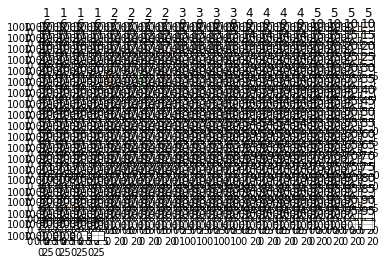

In [52]:
Xss.hist();

## Application of an analysis by principal component

In [54]:

acp=PCA(0.9)

In [55]:
Xacp=acp.fit_transform(Xss)

In [56]:
acp.explained_variance_ratio_.shape

(86,)

In [57]:
Xacp

array([[-5.75056432e-01, -6.44246862e-01, -2.29301839e-01, ...,
        -7.86911002e-01,  2.32690797e-11,  9.84507058e-13],
       [-9.93921024e-01, -1.79771782e+00, -4.60625862e+00, ...,
        -1.96005361e-02,  5.50065739e-13, -3.25176815e-14],
       [-9.93921024e-01, -1.79771782e+00, -4.60625862e+00, ...,
        -1.96005361e-02,  5.48322532e-13, -2.11929209e-14],
       ...,
       [-2.15506856e+00,  5.54175828e+00,  3.51092741e-01, ...,
        -1.13871342e-02,  2.97320940e-13,  6.96640812e-15],
       [-2.15506856e+00,  5.54175828e+00,  3.51092741e-01, ...,
        -1.13871342e-02,  2.97320940e-13,  6.96640812e-15],
       [-2.15506856e+00,  5.54175828e+00,  3.51092741e-01, ...,
        -1.13871342e-02,  2.97385486e-13,  6.99896749e-15]])

# Spliting of the dataset into two parts:train dataset and test dataset

In [58]:
#echantillonage alea
X_train, X_test = train_test_split(Xss,test_size=0.2,random_state=1)

In [59]:
print(X_train.shape)
print(X_test.shape)
print(dfa_encode.shape)

(1316, 384)
(329, 384)
(1645, 384)


In [61]:
Xss.to_csv('cleaned-data.csv')
X_train.to_csv('train-cleaned.csv')
X_test.to_csv('test-cleaned.csv')
